In [ ]:

%pip install -U shap lime scikit-image opencv-python pillow matplotlib pandas numpy tensorflow


Note: you may need to restart the kernel to use updated packages.


In [2]:
from pathlib import Path
import os, gc, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from PIL import Image
import shap
from lime import lime_image
from skimage.segmentation import mark_boundaries

SEED = 42
IMG_SIZE = (224, 224)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

SPLIT_DIR = Path("./DATASET_SPLIT")
OUTPUT_DIR = Path("./training_outputs")
MODEL_DIR = OUTPUT_DIR / "saved_models"
XAI_DIR = OUTPUT_DIR / "XAI"
GRADCAM_DIR = XAI_DIR / "GradCAM"
LIME_DIR = XAI_DIR / "LIME"

for d in [XAI_DIR, GRADCAM_DIR, LIME_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print("TensorFlow:", tf.__version__)
print("XAI output:", XAI_DIR.resolve())


c:\Users\emran\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


TensorFlow: 2.21.0
XAI output: E:\LSD_DETECTION_XAI_PROJECT\training_outputs\XAI


In [3]:
LSD_CLASS = "LSD_Affected" if (SPLIT_DIR/"test"/"LSD_Affected").exists() else "LSD"
CLASS_NAMES = ["Healthy", LSD_CLASS]
MODEL_NAMES = ["EfficientNetB0", "MobileNetV2", "ResNet50", "VGG16"]

MODEL_PATHS = {
    name: MODEL_DIR / f"{name}_best.keras"
    for name in MODEL_NAMES
}

available_models = {k: v for k, v in MODEL_PATHS.items() if v.exists()}
print("Classes:", CLASS_NAMES)
print("Available trained models:")
for name, path in available_models.items():
    print(f"  {name}: {path}")
if not available_models:
    raise FileNotFoundError("No *_best.keras model found in training_outputs/saved_models/")


Classes: ['Healthy', 'LSD_Affected']
Available trained models:
  EfficientNetB0: training_outputs\saved_models\EfficientNetB0_best.keras
  MobileNetV2: training_outputs\saved_models\MobileNetV2_best.keras
  ResNet50: training_outputs\saved_models\ResNet50_best.keras
  VGG16: training_outputs\saved_models\VGG16_best.keras


In [ ]:

comparison_csv = OUTPUT_DIR / "model_comparison_results.csv"

if comparison_csv.exists():
    comparison_df = pd.read_csv(comparison_csv).sort_values("F1", ascending=False)
    display(comparison_df)
    BEST_MODEL_NAME = comparison_df.iloc[0]["Model"]
else:
   
    BEST_MODEL_NAME = list(available_models.keys())[0]

BEST_MODEL_PATH = MODEL_PATHS[BEST_MODEL_NAME]
model = keras.models.load_model(BEST_MODEL_PATH)

print("Selected model:", BEST_MODEL_NAME)
print("Model path:", BEST_MODEL_PATH)
model.summary()


,Model,Accuracy,Precision,Recall,F1,AUC,Test Loss,Training Time (min)
0,ResNet50,0.879518,0.916667,0.825,0.868421,0.950581,0.383961,9.195729
1,MobileNetV2,0.867470,0.871795,0.850,0.860759,0.956977,0.317674,3.268582
2,EfficientNetB0,0.855422,0.818182,0.900,0.857143,0.950000,0.350491,5.192140
3,VGG16,0.843373,0.935484,0.725,0.816901,0.930233,0.429354,50.747075


Selected model: ResNet50
Model path: training_outputs\saved_models\ResNet50_best.keras


Model: "ResNet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image (InputLayer)              │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ prediction (Dense)              │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 53,232,261 (203.06 MB)

 Trainable params: 14,691,073 (56.04 MB)

 Non-trainable params: 9,159,040 (34.94 MB)

 Optimizer params: 29,382,148 (112.08 MB)

In [ ]:
def preprocess_for_model(model_name, images):
    images = tf.cast(images, tf.float32)

    if model_name == "EfficientNetB0":
        return images

    if model_name == "MobileNetV2":
        return tf.keras.applications.mobilenet_v2.preprocess_input(images)

    if model_name == "ResNet50":
        return tf.keras.applications.resnet50.preprocess_input(images)

    if model_name == "VGG16":
        return tf.keras.applications.vgg16.preprocess_input(images)

    raise ValueError(f"Unknown model: {model_name}")


In [6]:
SUPPORTED_EXTENSIONS = {".jpg", ".jpeg", ".png", ".webp", ".bmp", ".avif"}

test_rows = []
for class_id, class_name in enumerate(CLASS_NAMES):
    folder = SPLIT_DIR / "test" / class_name
    if folder.exists():
        for p in folder.rglob("*"):
            if p.is_file() and p.suffix.lower() in SUPPORTED_EXTENSIONS:
                test_rows.append({
                    "path": str(p),
                    "class_id": class_id,
                    "class_name": class_name
                })

test_df = pd.DataFrame(test_rows)
print("Test images:", len(test_df))
display(test_df["class_name"].value_counts().rename("count").to_frame())
display(test_df.head())


Test images: 98


,count
class_name,
Healthy,49
LSD_Affected,49


,path,class_id,class_name
0,DATASET_SPLIT\test\Healthy\Healthy_0551.jpg,0,Healthy
1,DATASET_SPLIT\test\Healthy\Healthy_0552.jpg,0,Healthy
2,DATASET_SPLIT\test\Healthy\Healthy_0554.jpg,0,Healthy
3,DATASET_SPLIT\test\Healthy\Healthy_0557.jpg,0,Healthy
4,DATASET_SPLIT\test\Healthy\Healthy_0558.jpg,0,Healthy


In [7]:
def load_image(path):
    img = Image.open(path).convert("RGB")
    img = img.resize(IMG_SIZE)
    return np.asarray(img).astype(np.float32)

def predict_proba(images):
    images = np.asarray(images).astype(np.float32)
    batch = preprocess_for_model(BEST_MODEL_NAME, images)
    p_lsd = model.predict(batch, verbose=0).reshape(-1)
    # Model output is P(class 1), where class 1 is LSD.
    return np.column_stack([1.0 - p_lsd, p_lsd])

def predict_single(path):
    img = load_image(path)
    probs = predict_proba(np.expand_dims(img, 0))[0]
    pred_id = int(np.argmax(probs))
    return img, probs, pred_id


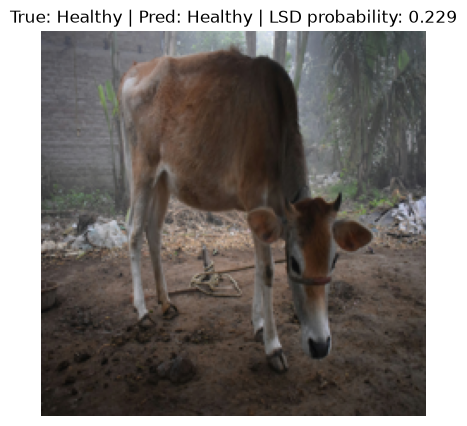

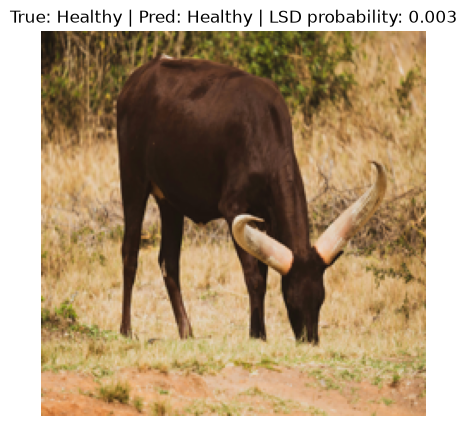

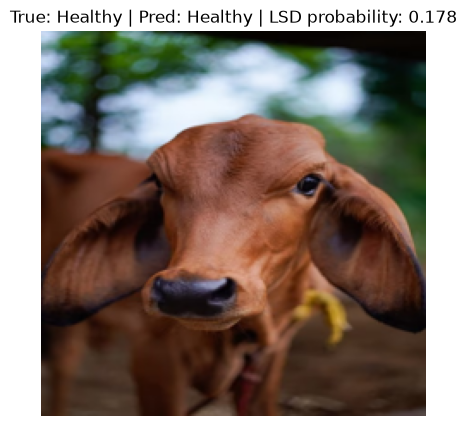

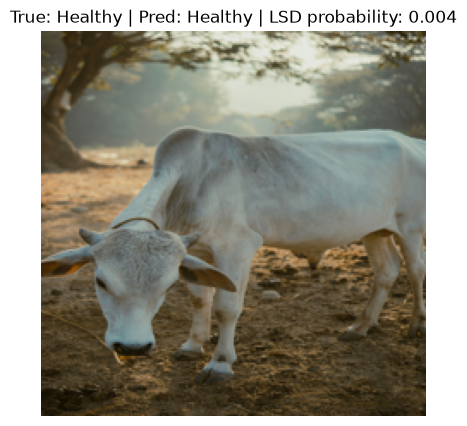

In [8]:
def show_prediction(path):
    img, probs, pred_id = predict_single(path)
    true_id = int(test_df.loc[test_df["path"] == str(path), "class_id"].iloc[0])

    plt.figure(figsize=(6, 5))
    plt.imshow(img.astype(np.uint8))
    plt.axis("off")
    plt.title(
        f"True: {CLASS_NAMES[true_id]} | "
        f"Pred: {CLASS_NAMES[pred_id]} | "
        f"LSD probability: {probs[1]:.3f}"
    )
    plt.show()

for path in test_df["path"].head(4):
    show_prediction(path)


In [ ]:

PREFERRED_CONV_LAYERS = {
    "EfficientNetB0": ["top_activation"],
    "MobileNetV2": ["out_relu"],
    "ResNet50": ["conv5_block3_out"],
    "VGG16": ["block5_conv3"]
}

def find_nested_backbone(outer_model):
    nested = [layer for layer in outer_model.layers if isinstance(layer, keras.Model)]
    if not nested:
        return outer_model
    nested.sort(key=lambda x: x.count_params(), reverse=True)
    return nested[0]

def find_gradcam_layer(backbone, model_name):
    for layer_name in PREFERRED_CONV_LAYERS.get(model_name, []):
        try:
            layer = backbone.get_layer(layer_name)
            if len(layer.output.shape) == 4:
                return layer
        except Exception:
            pass

    
    candidates = []
    for layer in backbone.layers:
        try:
            if len(layer.output.shape) == 4:
                candidates.append(layer)
        except Exception:
            pass

    if not candidates:
        raise ValueError(f"No 4-D convolutional feature layer found for {model_name}.")

    return candidates[-1]

backbone = find_nested_backbone(model)
last_conv_layer = find_gradcam_layer(backbone, BEST_MODEL_NAME)

print("Selected model:", BEST_MODEL_NAME)
print("Backbone:", backbone.name)
print("Grad-CAM layer:", last_conv_layer.name)
print("Feature-map shape:", last_conv_layer.output.shape)


Selected model: ResNet50
Backbone: resnet50
Grad-CAM layer: conv5_block3_out
Feature-map shape: (None, 7, 7, 2048)


In [ ]:

def make_gradcam_heatmap(img_array, target_class=None):
 
    raw = np.asarray(img_array, dtype=np.float32)
    if raw.shape[:2] != IMG_SIZE:
        raw = tf.image.resize(raw, IMG_SIZE).numpy()

    # Same preprocessing convention used during training.
    x = preprocess_for_model(
        BEST_MODEL_NAME,
        tf.convert_to_tensor(np.expand_dims(raw, axis=0))
    )
    x = tf.cast(x, tf.float32)

    
    feature_model = keras.Model(
        inputs=backbone.input,
        outputs=last_conv_layer.output
    )

    backbone_index = model.layers.index(backbone)
    classifier_layers = model.layers[backbone_index + 1:]

    if not classifier_layers:
        raise ValueError("No classifier layers found after the backbone.")

    with tf.GradientTape() as tape:
        conv_outputs = feature_model(x, training=False)
        tape.watch(conv_outputs)

        z = tf.reduce_mean(conv_outputs, axis=(1, 2))

        for layer in classifier_layers:
            try:
                z = layer(z, training=False)
            except TypeError:
                z = layer(z)

        probability = tf.reshape(z, [-1])[0]

        if target_class is None:
            target_class = tf.cast(probability >= 0.5, tf.int32)
        else:
            target_class = tf.cast(target_class, tf.int32)

        class_score = tf.where(
            target_class == 1,
            probability,
            1.0 - probability
        )

    grads = tape.gradient(class_score, conv_outputs)

    if grads is None:
        raise RuntimeError(
            "Gradients are None. The selected convolutional feature map "
            "is not connected to the classifier path. Check the model architecture."
        )

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    feature_maps = conv_outputs[0]

    heatmap = tf.reduce_sum(
        feature_maps * pooled_grads[tf.newaxis, tf.newaxis, :],
        axis=-1
    )
    
    heatmap = tf.maximum(heatmap, 0)
    maximum = tf.reduce_max(heatmap)
    heatmap = tf.where(
        maximum > 0,
        heatmap / (maximum + 1e-8),
        tf.zeros_like(heatmap)
    )

    heatmap = tf.image.resize(
        heatmap[..., tf.newaxis],
        IMG_SIZE
    )

    return np.clip(heatmap.numpy().squeeze(), 0, 1)


In [11]:
def explain_with_gradcam(path, target_class=None, save=True):
    img, probs, pred_id = predict_single(path)

    if target_class is None:
        target_class = pred_id

    heatmap = make_gradcam_heatmap(
        img,
        target_class=target_class
    )

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(img.astype(np.uint8))
    axes[0].set_title("Original")
    axes[0].axis("off")

    axes[1].imshow(heatmap, cmap="jet")
    axes[1].set_title(f"Grad-CAM: {CLASS_NAMES[target_class]}")
    axes[1].axis("off")

    axes[2].imshow(img.astype(np.uint8))
    axes[2].imshow(
        heatmap,
        cmap="jet",
        alpha=0.40
    )
    axes[2].set_title(
        f"Prediction: {CLASS_NAMES[pred_id]}\n"
        f"P(LSD)={probs[1]:.3f}"
    )
    axes[2].axis("off")

    plt.tight_layout()

    if save:
        out_name = Path(path).stem + "_gradcam.png"
        plt.savefig(
            GRADCAM_DIR / out_name,
            dpi=300,
            bbox_inches="tight"
        )

    plt.show()
    plt.close(fig)

    return heatmap, probs, pred_id


Healthy example:


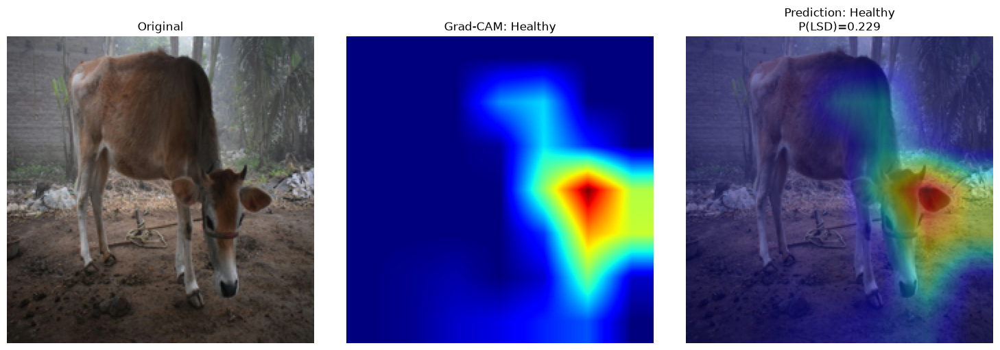

LSD example:


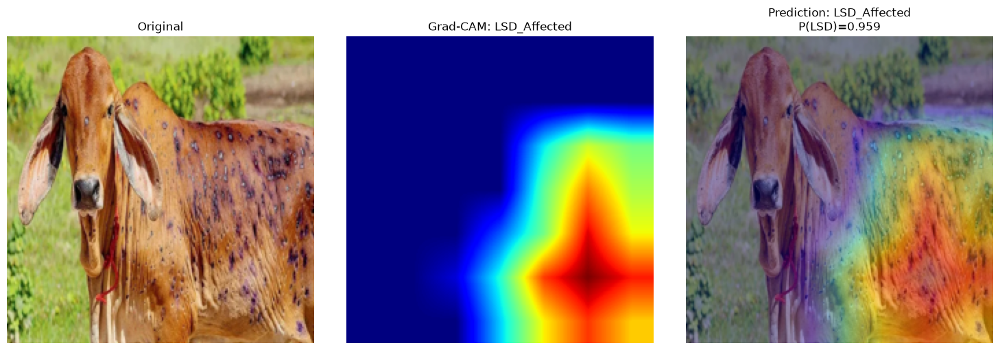

In [12]:
healthy_examples = test_df[test_df["class_id"] == 0]
lsd_examples = test_df[test_df["class_id"] == 1]

if len(healthy_examples) > 0:
    print("Healthy example:")
    explain_with_gradcam(healthy_examples.iloc[0]["path"])

if len(lsd_examples) > 0:
    print("LSD example:")
    explain_with_gradcam(lsd_examples.iloc[0]["path"])


In [13]:
pred_records = []

for _, row in test_df.iterrows():
    img, probs, pred_id = predict_single(row["path"])
    pred_records.append({
        "path": row["path"],
        "true_class": row["class_name"],
        "pred_class": CLASS_NAMES[pred_id],
        "true_id": row["class_id"],
        "pred_id": pred_id,
        "lsd_probability": float(probs[1])
    })

pred_df = pd.DataFrame(pred_records)
pred_df["correct"] = pred_df["true_id"] == pred_df["pred_id"]

print("Correct:", int(pred_df["correct"].sum()))
print("Incorrect:", int((~pred_df["correct"]).sum()))
display(pred_df.head())


Correct: 88
Incorrect: 10


,path,true_class,pred_class,true_id,pred_id,lsd_probability,correct
0,DATASET_SPLIT\test\Healthy\Healthy_0551.jpg,Healthy,Healthy,0,0,0.229472,True
1,DATASET_SPLIT\test\Healthy\Healthy_0552.jpg,Healthy,Healthy,0,0,0.002572,True
2,DATASET_SPLIT\test\Healthy\Healthy_0554.jpg,Healthy,Healthy,0,0,0.177594,True
3,DATASET_SPLIT\test\Healthy\Healthy_0557.jpg,Healthy,Healthy,0,0,0.004272,True
4,DATASET_SPLIT\test\Healthy\Healthy_0558.jpg,Healthy,Healthy,0,0,0.017656,True


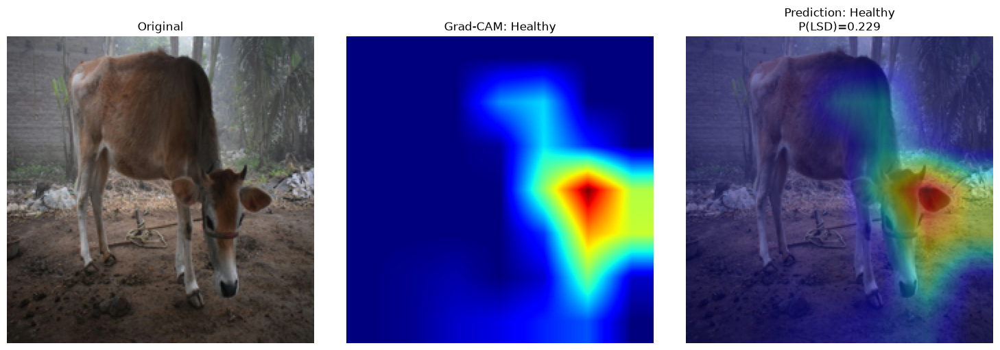

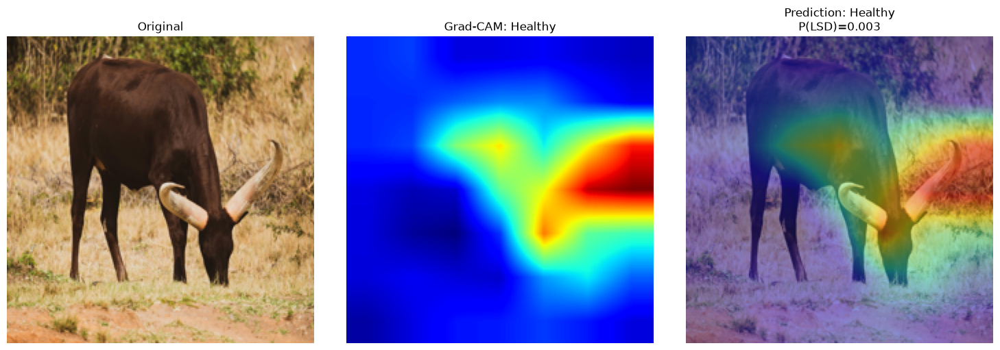

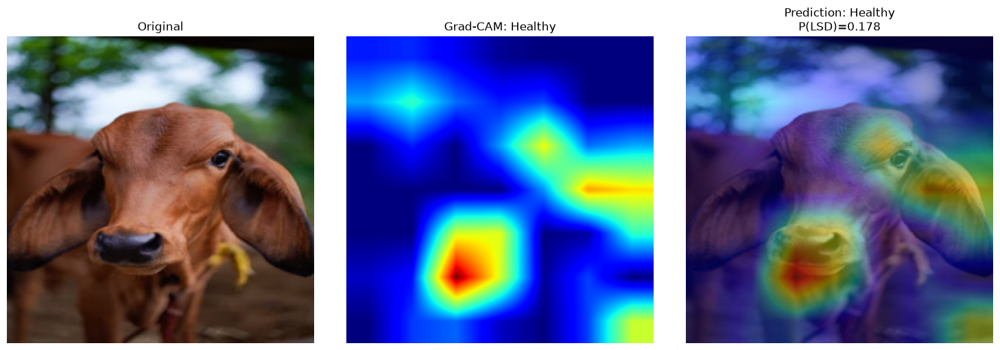

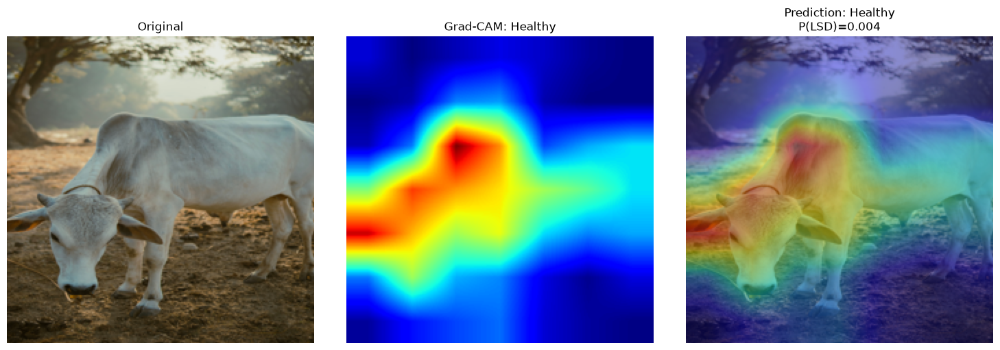

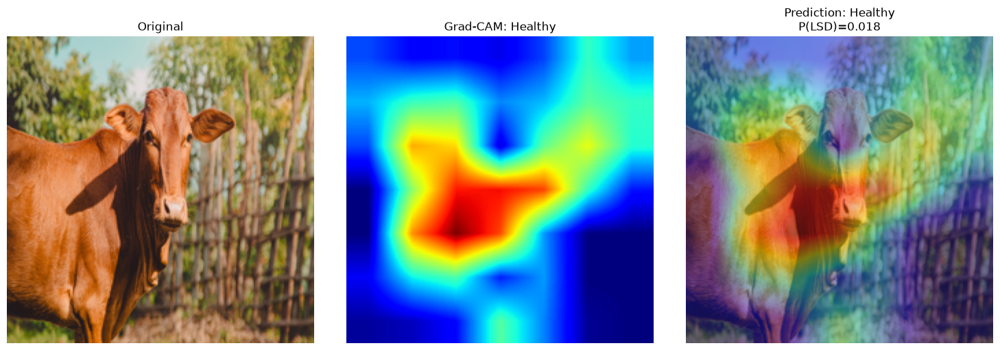

...

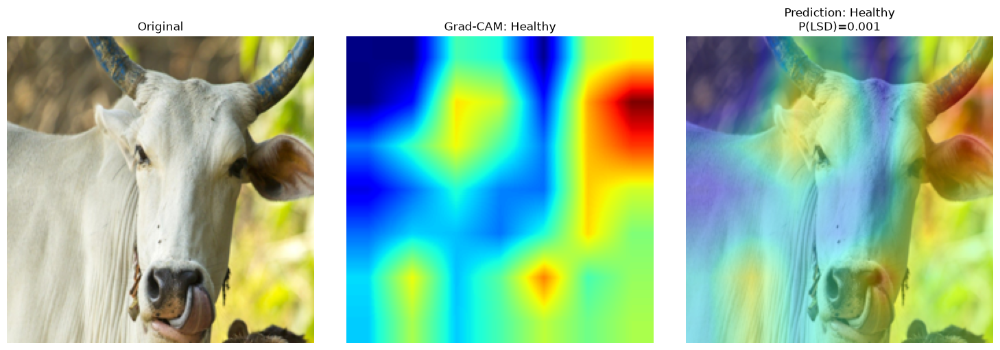

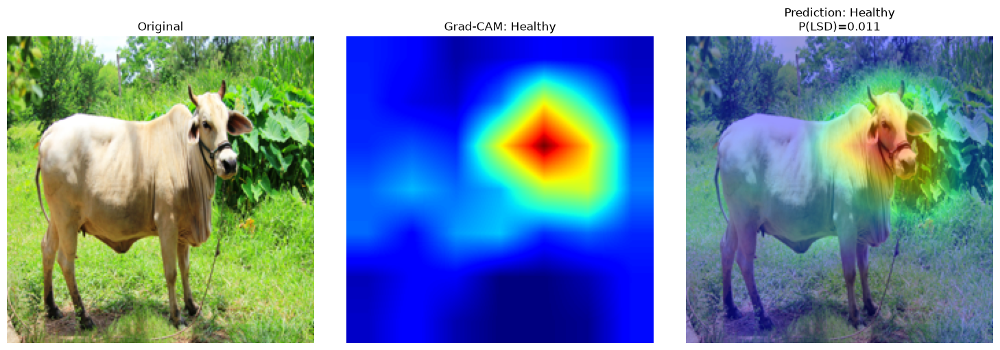

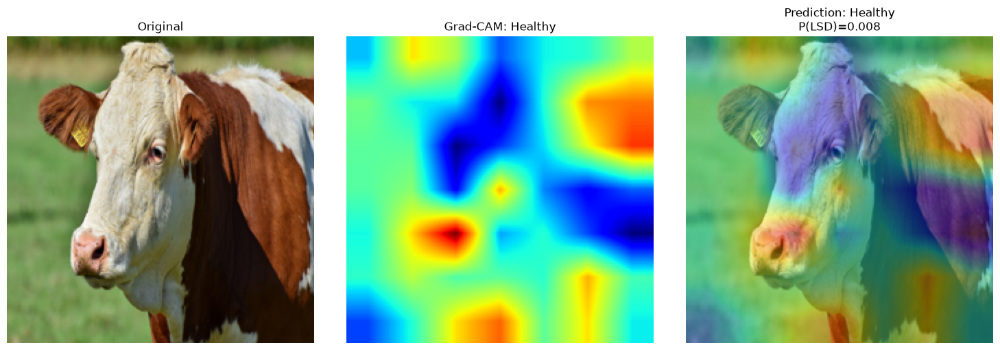

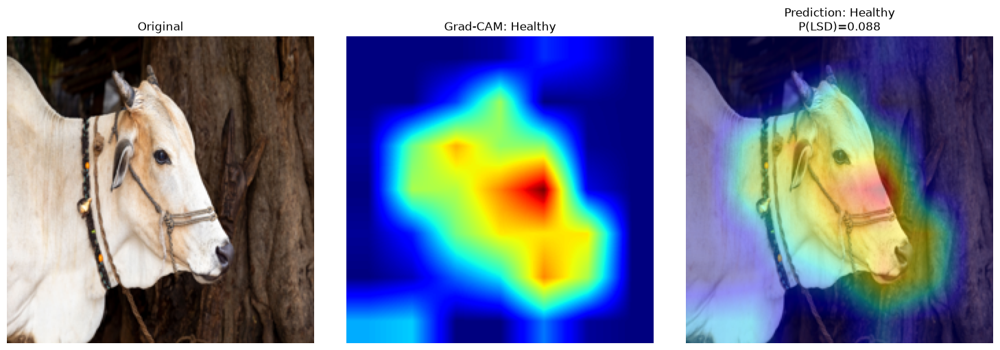

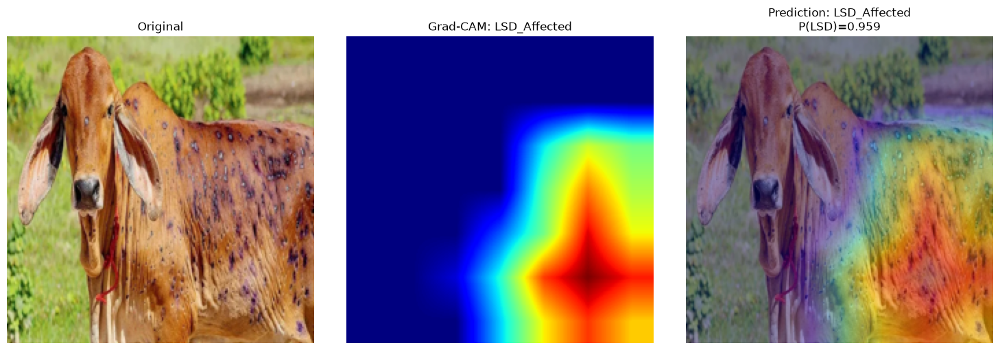

In [ ]:
MAX_GRADCAM_IMAGES_PER_CLASS = 10

selected = (
    pred_df[pred_df["correct"]]
    .groupby("true_id", group_keys=False)
    .head(MAX_GRADCAM_IMAGES_PER_CLASS)
)

for _, row in selected.iterrows():
    try:
        explain_with_gradcam(row["path"], target_class=int(row["pred_id"]), save=True)
    except Exception as e:
        print("Grad-CAM failed:", row["path"], "|", repr(e))


In [ ]:
lime_explainer = lime_image.LimeImageExplainer(random_state=SEED)

def explain_with_lime(path, num_samples=1000, save=True):
    img, probs, pred_id = predict_single(path)

    explanation = lime_explainer.explain_instance(
        img.astype(np.uint8),
        classifier_fn=predict_proba,
        top_labels=2,
        hide_color=0,
        num_samples=num_samples
    )

    temp, mask = explanation.get_image_and_mask(
        label=pred_id,
        positive_only=False,
        num_features=12,
        hide_rest=False
    )

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(img.astype(np.uint8))
    axes[0].set_title("Original")
    axes[0].axis("off")

    axes[1].imshow(mark_boundaries(temp / 255.0, mask))
    axes[1].set_title(
        f"LIME — predicted: {CLASS_NAMES[pred_id]}\n"
        f"P(LSD)={probs[1]:.3f}"
    )
    axes[1].axis("off")

    plt.tight_layout()

    if save:
        out_name = Path(path).stem + "_lime.png"
        plt.savefig(LIME_DIR / out_name, dpi=200, bbox_inches="tight")

    plt.show()
    plt.close(fig)

    return explanation, probs, pred_id


In [ ]:
if len(healthy_examples) > 0:
    print("Healthy example:")
    explain_with_lime(healthy_examples.iloc[0]["path"], num_samples=1000)

if len(lsd_examples) > 0:
    print("LSD example:")
    explain_with_lime(lsd_examples.iloc[0]["path"], num_samples=1000)


In [ ]:

def shap_predict(images):
    """SHAP-compatible prediction function.
    Input: numpy array of RGB images in [0,255].
    Output: two-class probabilities [Healthy, LSD_Affected].
    """
    images = np.asarray(images, dtype=np.float32)

    if images.ndim == 3:
        images = images[None, ...]

    if images.shape[1:3] != IMG_SIZE:
        images = np.stack([
            tf.image.resize(img, IMG_SIZE).numpy()
            for img in images
        ])

    batch = preprocess_for_model(
        BEST_MODEL_NAME,
        tf.convert_to_tensor(images, dtype=tf.float32)
    )

    p_lsd = model.predict(batch, verbose=0).reshape(-1)
    return np.column_stack([1.0 - p_lsd, p_lsd])


def explain_with_shap(path, max_evals=300, save=True):
    """Generate a SHAP image explanation for one test image.

    max_evals controls runtime. Start around 200-300; increase later
    (e.g. 500-1000) for a more detailed thesis figure.
    """
    img, probs, pred_id = predict_single(path)

    masker = shap.maskers.Image(
        "blur(32,32)",
        IMG_SIZE + (3,)
    )

    explainer = shap.Explainer(
        shap_predict,
        masker,
        output_names=CLASS_NAMES,
        algorithm="partition"
    )

    shap_values = explainer(
        np.expand_dims(img, axis=0),
        max_evals=max_evals,
        batch_size=8
    )

    values = shap_values.values
    if values.ndim == 5:
        class_values = values[0, ..., pred_id]
    elif values.ndim == 4:
        class_values = values[0]
    else:
        raise ValueError(f"Unexpected SHAP value shape: {values.shape}")

    if class_values.ndim == 3:
        spatial = np.sum(class_values, axis=-1)
    else:
        spatial = class_values

    vmax = np.percentile(np.abs(spatial), 99)
    vmax = max(float(vmax), 1e-8)

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    axes[0].imshow(img.astype(np.uint8))
    axes[0].set_title(
        f"Original\nPred: {CLASS_NAMES[pred_id]} | P(LSD)={probs[1]:.3f}"
    )
    axes[0].axis("off")

    im = axes[1].imshow(spatial, cmap="coolwarm", vmin=-vmax, vmax=vmax)
    axes[1].set_title(f"SHAP contribution: {CLASS_NAMES[pred_id]}")
    axes[1].axis("off")
    fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

    axes[2].imshow(img.astype(np.uint8))
    axes[2].imshow(spatial, cmap="coolwarm", alpha=0.45, vmin=-vmax, vmax=vmax)
    axes[2].set_title("SHAP overlay")
    axes[2].axis("off")

    plt.tight_layout()

    if save:
        out_name = Path(path).stem + "_shap.png"
        plt.savefig(
            XAI_DIR / out_name,
            dpi=300,
            bbox_inches="tight"
        )

    plt.show()
    plt.close(fig)

    return shap_values, spatial, probs, pred_id


In [ ]:

correct_lsd = pred_df[(pred_df["true_id"] == 1) & (pred_df["correct"])]
correct_healthy = pred_df[(pred_df["true_id"] == 0) & (pred_df["correct"])]

if len(correct_lsd) > 0:
    print("SHAP — correctly classified LSD image")
    shap_result_lsd = explain_with_shap(
        correct_lsd.iloc[0]["path"],
        max_evals=300
    )
else:
    print("No correctly classified LSD image found.")

if len(correct_healthy) > 0:
    print("SHAP — correctly classified Healthy image")
    shap_result_healthy = explain_with_shap(
        correct_healthy.iloc[0]["path"],
        max_evals=300
    )
else:
    print("No correctly classified Healthy image found.")


In [ ]:
def compare_all_xai(path, lime_samples=500, shap_evals=300):
    img, probs, pred_id = predict_single(path)

    # Grad-CAM
    gradcam = make_gradcam_heatmap(img, target_class=pred_id)

    # LIME
    lime_exp = lime_explainer.explain_instance(
        img.astype(np.uint8),
        classifier_fn=predict_proba,
        top_labels=2,
        hide_color=0,
        num_samples=lime_samples
    )
    lime_img, lime_mask = lime_exp.get_image_and_mask(
        label=pred_id,
        positive_only=False,
        num_features=12,
        hide_rest=False
    )

    # SHAP
    masker = shap.maskers.Image("blur(32,32)", IMG_SIZE + (3,))
    shap_explainer = shap.Explainer(
        shap_predict,
        masker,
        output_names=CLASS_NAMES,
        algorithm="partition"
    )
    sv = shap_explainer(
        np.expand_dims(img, axis=0),
        max_evals=shap_evals,
        batch_size=8
    )
    values = sv.values
    if values.ndim == 5:
        shap_map = values[0, ..., pred_id]
    else:
        shap_map = values[0]
    if shap_map.ndim == 3:
        shap_map = np.sum(shap_map, axis=-1)

    vmax = max(float(np.percentile(np.abs(shap_map), 99)), 1e-8)

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    axes[0].imshow(img.astype(np.uint8))
    axes[0].set_title(
        f"Original\nPred: {CLASS_NAMES[pred_id]} | P(LSD)={probs[1]:.3f}"
    )
    axes[0].axis("off")

    axes[1].imshow(img.astype(np.uint8))
    axes[1].imshow(gradcam, cmap="jet", alpha=0.40)
    axes[1].set_title("Grad-CAM")
    axes[1].axis("off")

    axes[2].imshow(mark_boundaries(lime_img / 255.0, lime_mask))
    axes[2].set_title("LIME")
    axes[2].axis("off")

    axes[3].imshow(img.astype(np.uint8))
    axes[3].imshow(shap_map, cmap="coolwarm", alpha=0.45, vmin=-vmax, vmax=vmax)
    axes[3].set_title("SHAP")
    axes[3].axis("off")

    plt.tight_layout()
    out_name = Path(path).stem + "_GradCAM_LIME_SHAP.png"
    plt.savefig(XAI_DIR / out_name, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close(fig)

    return sv, lime_exp, gradcam


In [ ]:

if len(correct_lsd) > 0:
    compare_all_xai(
        correct_lsd.iloc[0]["path"],
        lime_samples=500,
        shap_evals=300
    )
else:
    print("No correctly classified LSD test image was found.")


In [ ]:
def compare_xai(path, lime_samples=1000):
    img, probs, pred_id = predict_single(path)
    heatmap = make_gradcam_heatmap(img, target_class=pred_id)

    explanation = lime_explainer.explain_instance(
        img.astype(np.uint8),
        classifier_fn=predict_proba,
        top_labels=2,
        hide_color=0,
        num_samples=lime_samples
    )
    lime_img, lime_mask = explanation.get_image_and_mask(
        label=pred_id,
        positive_only=False,
        num_features=12,
        hide_rest=False
    )

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    axes[0].imshow(img.astype(np.uint8))
    axes[0].set_title(
        f"Original\nPred: {CLASS_NAMES[pred_id]} | P(LSD)={probs[1]:.3f}"
    )
    axes[0].axis("off")

    axes[1].imshow(img.astype(np.uint8))
    axes[1].imshow(np.uint8(255 * heatmap), cmap="jet", alpha=0.40)
    axes[1].set_title("Grad-CAM")
    axes[1].axis("off")

    axes[2].imshow(mark_boundaries(lime_img / 255.0, lime_mask))
    axes[2].set_title("LIME")
    axes[2].axis("off")

    plt.tight_layout()
    out_name = Path(path).stem + "_GradCAM_vs_LIME.png"
    plt.savefig(XAI_DIR / out_name, dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)

    return explanation


In [ ]:

correct_lsd = pred_df[(pred_df["true_id"] == 1) & (pred_df["correct"])]

if len(correct_lsd) > 0:
    compare_xai(correct_lsd.iloc[0]["path"], lime_samples=1000)
else:
    print("No correctly classified LSD test image was found.")


In [ ]:
xai_summary = pred_df.copy()
xai_summary["model"] = BEST_MODEL_NAME

summary_path = XAI_DIR / "XAI_prediction_summary.csv"
xai_summary.to_csv(summary_path, index=False)

display(xai_summary.head(20))
print("Saved:", summary_path)
print("Grad-CAM folder:", GRADCAM_DIR)
print("LIME folder:", LIME_DIR)
